In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler,OneHotEncoder
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
%matplotlib inline
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi']=250

In [22]:
# 1. DATA LOADING & INSPECTION
# ======================
df = pd.read_csv("Maha_Agri.csv")

# Initial inspection

print("\nFirst 5 Rows:")
print(df.head())
print("\nLast 5 Rows:")
print(df.tail())



First 5 Rows:
     District               Crop     Year  Season  Area  Production  Yield
0      NANDED        Castor seed  2015-16  Kharif  10.0         1.0   0.10
1  SINDHUDURG        Castor seed  2015-16  Kharif   5.0         1.0   0.20
2       LATUR          Groundnut  2015-16  Summer   8.0         1.0   0.13
3      NANDED            Linseed  2015-16    Rabi  10.0         1.0   0.10
4  GADCHIROLI  Moong(Green Gram)  2015-16  Summer   3.0         1.0   0.33

Last 5 Rows:
      District   Crop     Year  Season     Area  Production  Yield
2105  BULDHANA   Urad  2019-20  Kharif  16580.0     11031.0   0.67
2106  KOLHAPUR   Urad  2019-20  Kharif   1871.0      1564.0   0.84
2107     LATUR   Urad  2019-20  Kharif   7538.0      4287.0   0.57
2108    GONDIA  Wheat  2019-20    Rabi   3032.0      1690.0   0.56
2109  KOLHAPUR  Wheat  2019-20    Rabi   3398.0      8001.0   2.35


In [23]:
print("\nData Types:")
print(df.dtypes)
print("\n================================")
print("\nDataset Shape:\n")
print(df.shape)
print("\n================================")
print("\nMissing Values:\n")
print(df.isnull().sum())


Data Types:
District       object
Crop           object
Year           object
Season         object
Area          float64
Production    float64
Yield         float64
dtype: object


Dataset Shape:

(2110, 7)


Missing Values:

District      0
Crop          0
Year          0
Season        0
Area          0
Production    0
Yield         0
dtype: int64


In [24]:
# ======================
# 2. DATA CLEANING
# ======================

In [25]:
data_kharif = df[(df['Season'] == 'Kharif') & (df['Area'] > 100) & (df['Production'] > 100)].sort_values(by='Year')

data_rabi = df[(df['Season'] == 'Rabi') & (df['Area'] > 100) & (df['Production'] > 100)].sort_values(by='Year')

data_wyear = df[(df['Season'] == 'Whole Year') & (df['Area'] > 100) & (df['Production'] > 100)].sort_values(by='Year')


In [26]:
data_kharif.head()

,District,Crop,Year,Season,Area,Production,Yield
485,AURANGABAD,Bajra,2010-11,Kharif,89800.0,126500.0,1.41
879,NASHIK,Soyabean,2010-11,Kharif,56900.0,80900.0,1.42
739,SOLAPUR,Maize,2010-11,Kharif,20500.0,34800.0,1.70
601,SATARA,Groundnut,2010-11,Kharif,50100.0,81600.0,1.63
599,PUNE,Groundnut,2010-11,Kharif,35700.0,45900.0,1.29


In [27]:
data_rabi.head()

,District,Crop,Year,Season,Area,Production,Yield
561,AHMEDNAGAR,Gram,2010-11,Rabi,115200.0,94000.0,0.82
727,SANGLI,Maize,2010-11,Rabi,15500.0,48900.0,3.15
973,AKOLA,Wheat,2010-11,Rabi,37800.0,89900.0,2.38
723,PUNE,Maize,2010-11,Rabi,14800.0,47700.0,3.22
976,AMRAVATI,Wheat,2010-11,Rabi,54700.0,105400.0,1.93


In [28]:
data_wyear.head()

,District,Crop,Year,Season,Area,Production,Yield
899,AHMEDNAGAR,Sugarcane,2010-11,Whole Year,126000.0,11516400.0,91.4
924,KOLHAPUR,Sugarcane,2010-11,Whole Year,139900.0,12591000.0,90.0
954,SOLAPUR,Sugarcane,2010-11,Whole Year,163100.0,16000100.0,98.1
945,PUNE,Sugarcane,2010-11,Whole Year,111500.0,11083100.0,99.4
921,JALNA,Sugarcane,2010-11,Whole Year,19300.0,1192700.0,61.8


In [29]:
print(f"Total Whole-Year Records : {data_wyear.shape}")
print(f"Total Kharif Records : {data_kharif.shape}")
print(f"Total Rabi Records : {data_rabi.shape}")

Total Whole-Year Records : (74, 7)
Total Kharif Records : (452, 7)
Total Rabi Records : (268, 7)


In [30]:
print(data_kharif.describe())

                Area    Production       Yield
count     452.000000  4.520000e+02  452.000000
mean    83787.130531  1.276131e+05    1.334912
std     95868.406143  1.696548e+05    0.790436
min       118.000000  1.020000e+02    0.040000
25%     20500.000000  1.473500e+04    0.670000
50%     50250.000000  5.980000e+04    1.305000
75%    122125.000000  1.724000e+05    1.772500
max    558800.000000  1.097100e+06    4.000000


In [31]:
print(data_rabi.describe())

                Area     Production       Yield
count     268.000000     268.000000  268.000000
mean    70988.798507   68574.850746    1.333545
std    108003.213345   76834.984813    0.820345
min       164.000000     101.000000    0.180000
25%     20475.000000   24900.000000    0.757500
50%     38050.000000   49750.000000    1.120000
75%     75225.000000   86575.000000    1.745000
max    765000.000000  593200.000000    7.890000


In [32]:
print(data_wyear.describe())

                Area    Production       Yield
count      74.000000  7.400000e+01   74.000000
mean    40612.851351  3.439856e+06   74.652162
std     48599.871502  4.530219e+06   16.437689
min       154.000000  6.043000e+03   34.530000
25%      4825.000000  3.562250e+05   65.977500
50%     17100.000000  1.202550e+06   72.485000
75%     59550.000000  3.821950e+06   85.567500
max    173400.000000  1.600010e+07  116.410000


In [33]:
# total records of Crops Based On Season
print(f"Crops In Kharif Season : {data_kharif['Crop'].value_counts()}")
print("====================================================")
print(f"Crops In Rabi Season : {data_rabi['Crop'].value_counts()}")
print("====================================================")
print(f"Crops In Whole Year Season : {data_wyear['Crop'].value_counts()}")

Crops In Kharif Season : Soyabean             81
Cotton(lint)         67
Jowar                59
Rice                 46
Maize                41
Moong(Green Gram)    33
Bajra                28
Urad                 26
Arhar/Tur            24
Groundnut            19
Ragi                 12
Sesamum              10
Niger seed            3
Sunflower             3
Name: Crop, dtype: int64
Crops In Rabi Season : Wheat                81
Gram                 65
Jowar                52
Maize                30
Small millets        23
Safflower             8
Sesamum               3
Sunflower             3
Rapeseed &Mustard     2
Linseed               1
Name: Crop, dtype: int64
Crops In Whole Year Season : Sugarcane    74
Name: Crop, dtype: int64


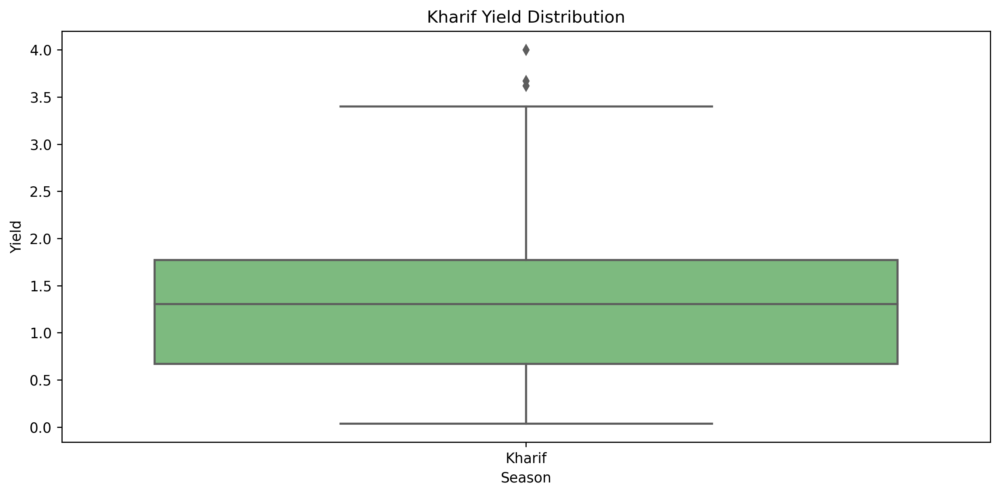

In [34]:
# kharif Box Plot
sns.boxplot(data=data_kharif, x='Season', y='Yield',palette='Greens')
plt.title('Kharif Yield Distribution')
plt.tight_layout()
plt.show()

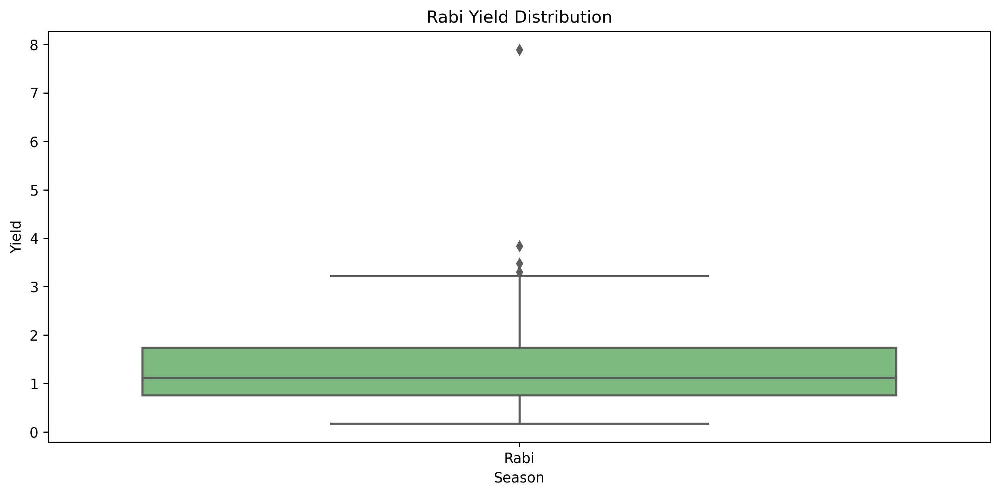

In [35]:
# Rabi Box Plot
sns.boxplot(data=data_rabi, x='Season', y='Yield',palette='Greens')
plt.title('Rabi Yield Distribution')
plt.tight_layout()
plt.show()

In [36]:
# Handle outliers (for numerical columns)
def handle_outliers(df, columns):
    for col in columns:
        if col in df.select_dtypes(include=np.number).columns:
            q1 = df[col].quantile(0.25)
            q3 = df[col].quantile(0.75)
            iqr = q3 - q1
            lower_bound = q1 - 1.5 * iqr
            upper_bound = q3 + 1.5 * iqr

    return lower_bound,upper_bound

In [37]:
kharif_out = handle_outliers(data_kharif,['Yield'])
rabi_out  = handle_outliers(data_rabi,['Yield'])
wyear_out = handle_outliers(data_wyear,['Yield'])
print("Kharif Upper and Lower Limit")
print(f"Lower Bound : {kharif_out[0]}")
print(f"Upper Bound : {kharif_out[1]}")
print("====================================================")
print("Rabi Upper and Lower Limit")
print(f"Lower Bound : {rabi_out[0]}")
print(f"Upper Bound : {rabi_out[1]}")
print("====================================================")
print("Whole Year Upper and Lower Limit")
print(f"Lower Bound : {wyear_out[0]}")
print(f"Upper Bound : {wyear_out[1]}")

Kharif Upper and Lower Limit
Lower Bound : -0.98375
Upper Bound : 3.42625
Rabi Upper and Lower Limit
Lower Bound : -0.7237500000000001
Upper Bound : 3.2262500000000003
Whole Year Upper and Lower Limit
Lower Bound : 36.59249999999999
Upper Bound : 114.9525


In [38]:
# Count outliers
# Total Whole-Year Records : 79
# Total Kharif     Records : 1100
# Total Rabi       Records : 745
kharif_outliers = data_kharif[(data_kharif['Yield'] < kharif_out[0]) | (data_kharif['Yield'] > kharif_out[1])]
rabi_outliers = data_rabi[(data_rabi['Yield'] < rabi_out[0]) | (data_rabi['Yield'] > rabi_out[1])]
wyear_outliers = data_wyear[(data_wyear['Yield'] < wyear_out[0]) | (data_wyear['Yield'] > wyear_out[1])]

print(f"Total outliers in Kharif dataset: {len(kharif_outliers)}")
print(f"Total outliers in Rabi dataset: {len(rabi_outliers)}")
print(f"Total outliers in Whole Year dataset: {len(wyear_outliers)}")

Total outliers in Kharif dataset: 3
Total outliers in Rabi dataset: 4
Total outliers in Whole Year dataset: 2


In [39]:
#========================
# DATA VISUALIZATION
#========================

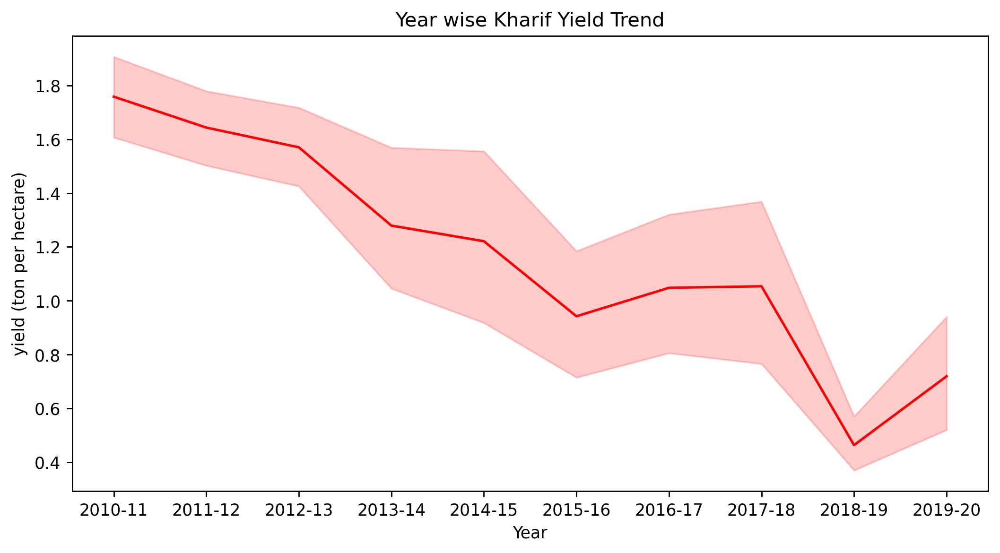

In [40]:
# Kharif Line plot
sns.lineplot(data=data_kharif, x='Year', y='Yield',color='red')
plt.title('Year wise Kharif Yield Trend')
plt.ylabel("yield (ton per hectare)")
plt.show()

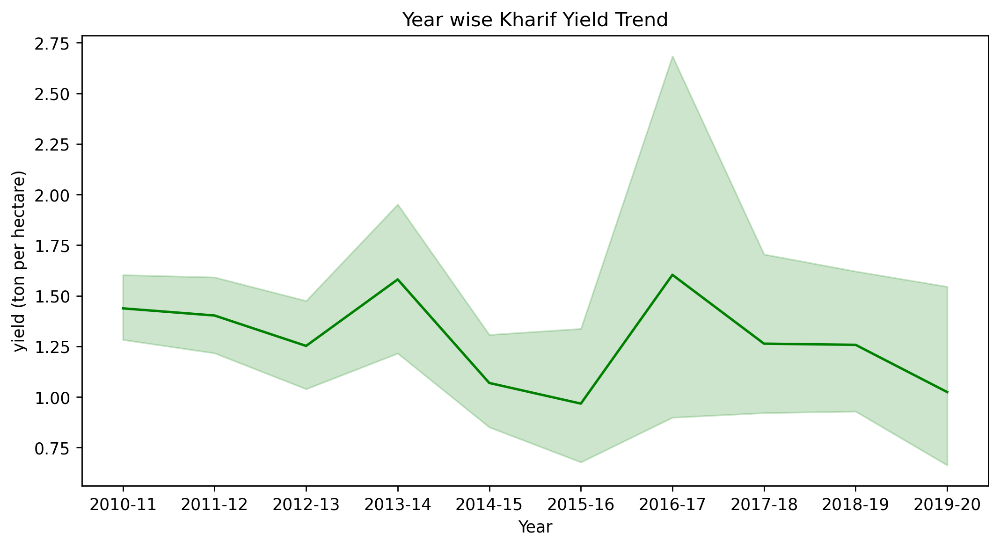

In [41]:
# Rabi Line Plot
sns.lineplot(data=data_rabi, x='Year', y='Yield',color='green')
plt.title('Year wise Kharif Yield Trend')
plt.ylabel("yield (ton per hectare)")
plt.show()

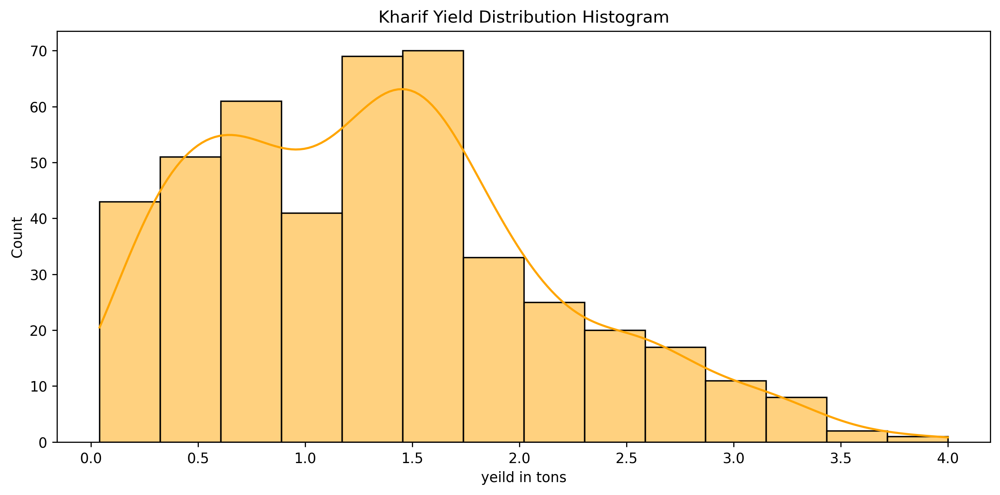

In [42]:
# Kharif Data Distribution
sns.histplot(data_kharif['Yield'], kde=True, color='orange')
plt.title('Kharif Yield Distribution Histogram')
plt.xlabel("yeild in tons")
plt.tight_layout()
plt.show()

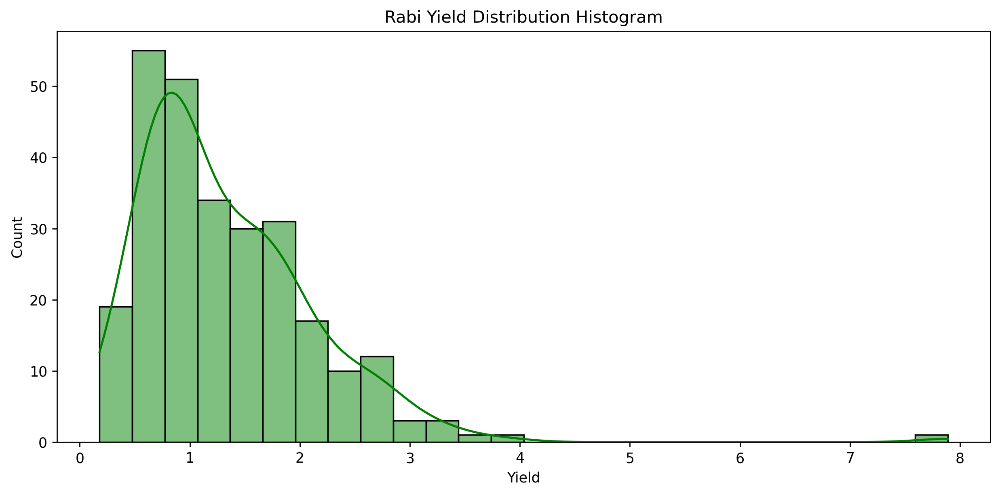

In [43]:
# Rabi Data Distribution
sns.histplot(data_rabi['Yield'], kde=True, color='green')
plt.title('Rabi Yield Distribution Histogram')
plt.tight_layout()
plt.show()

In [44]:
# Correlation analysis
corr_matrix = df.select_dtypes(include=np.number).corr()
print("\nCorrelation Matrix:")
print(corr_matrix)


Correlation Matrix:
                Area  Production     Yield
Area        1.000000    0.200092  0.056524
Production  0.200092    1.000000  0.676807
Yield       0.056524    0.676807  1.000000


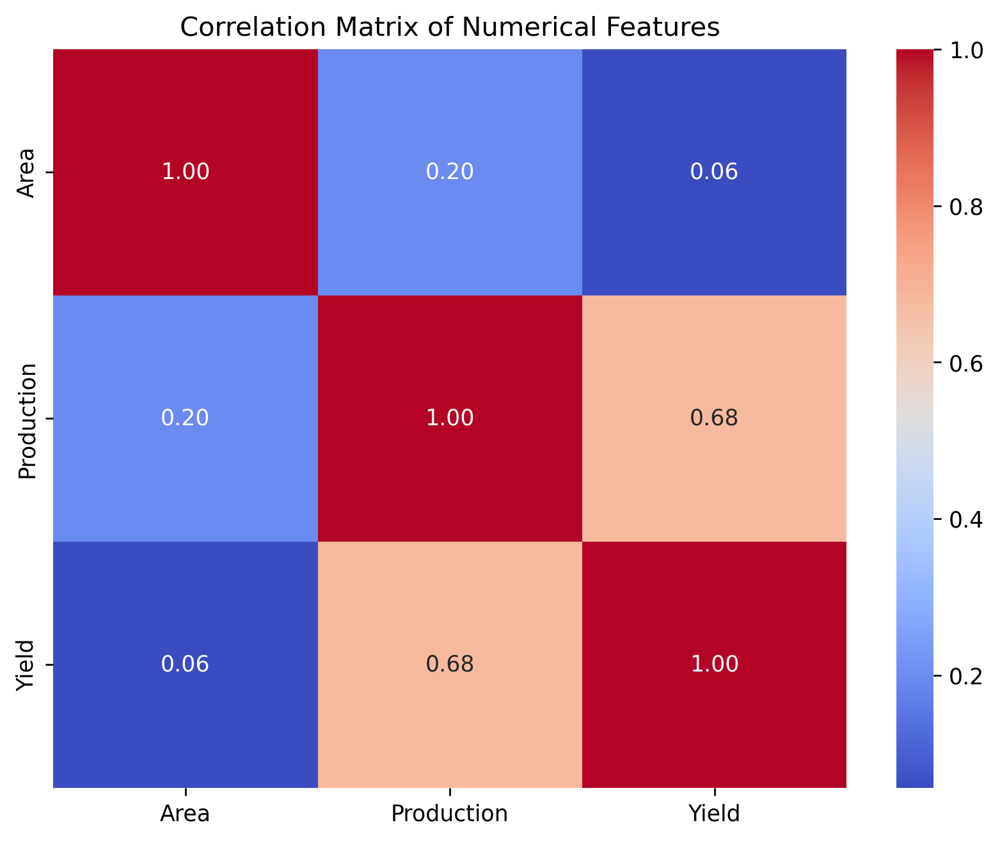

In [45]:
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

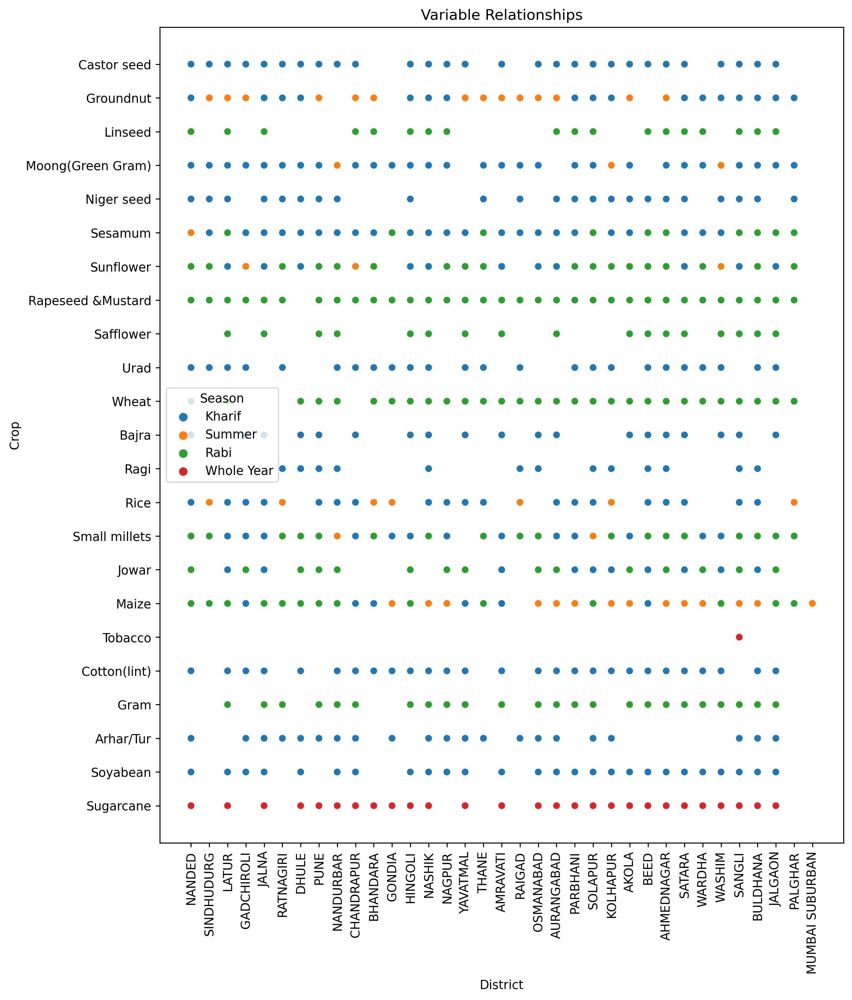

In [46]:
plt.figure(figsize=(10,12))
sns.scatterplot(data=df, x='District', y='Crop', hue='Season')
plt.xticks(rotation=90)
plt.title('Variable Relationships')
plt.show()

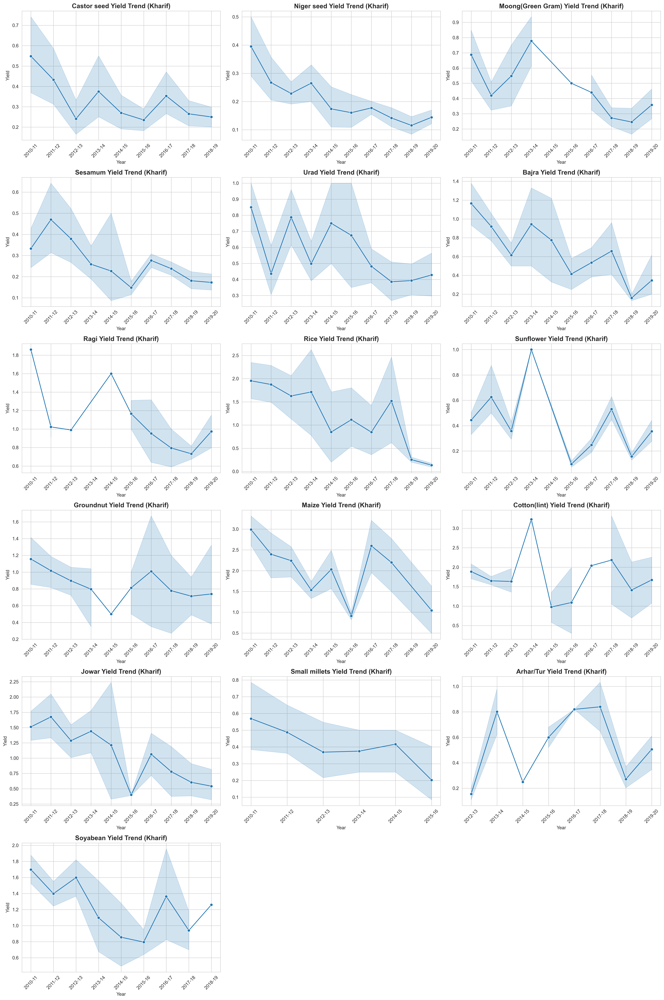

In [47]:
# --------------------------
# KHARIF SEASON VISUALIZATION
# --------------------------

# Filter only Kharif season data
kharif_data = df[df['Season'] == 'Kharif'].copy()

# Get all unique crop names grown in Kharif
unique_kharif_crops = kharif_data['Crop'].unique()

# Define the desired order of years
year_order = sorted(kharif_data['Year'].unique())

# Convert 'Year' to a categorical type with ordered categories
kharif_data['Year'] = pd.Categorical(kharif_data['Year'], categories=year_order, ordered=True)


# Count number of unique crops
num_crops = len(unique_kharif_crops)

# Define subplot grid (3 columns, rows calculated automatically)
num_cols = 3
num_rows = (num_crops + num_cols - 1) // num_cols

# Set seaborn style for consistency
sns.set_style("whitegrid")
sns.set_palette("tab10")

# Create subplot grid
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Flatten axes array to loop easily
axes = axes.flatten()

# Plot each crop’s yield trend
for i, crop in enumerate(unique_kharif_crops):
    # Filter data for this crop
    crop_data = kharif_data[kharif_data['Crop'] == crop]

    # Plot line graph (Year vs Yield)
    sns.lineplot(data=crop_data, x='Year', y='Yield', ax=axes[i], marker='o')

    # Add title and labels
    axes[i].set_title(f'{crop} Yield Trend (Kharif)', fontsize=14, fontweight='bold')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Yield')

    # Rotate x-axis ticks
    axes[i].tick_params(axis='x', rotation=45)

# Remove unused subplot spaces
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Show figure
plt.show()

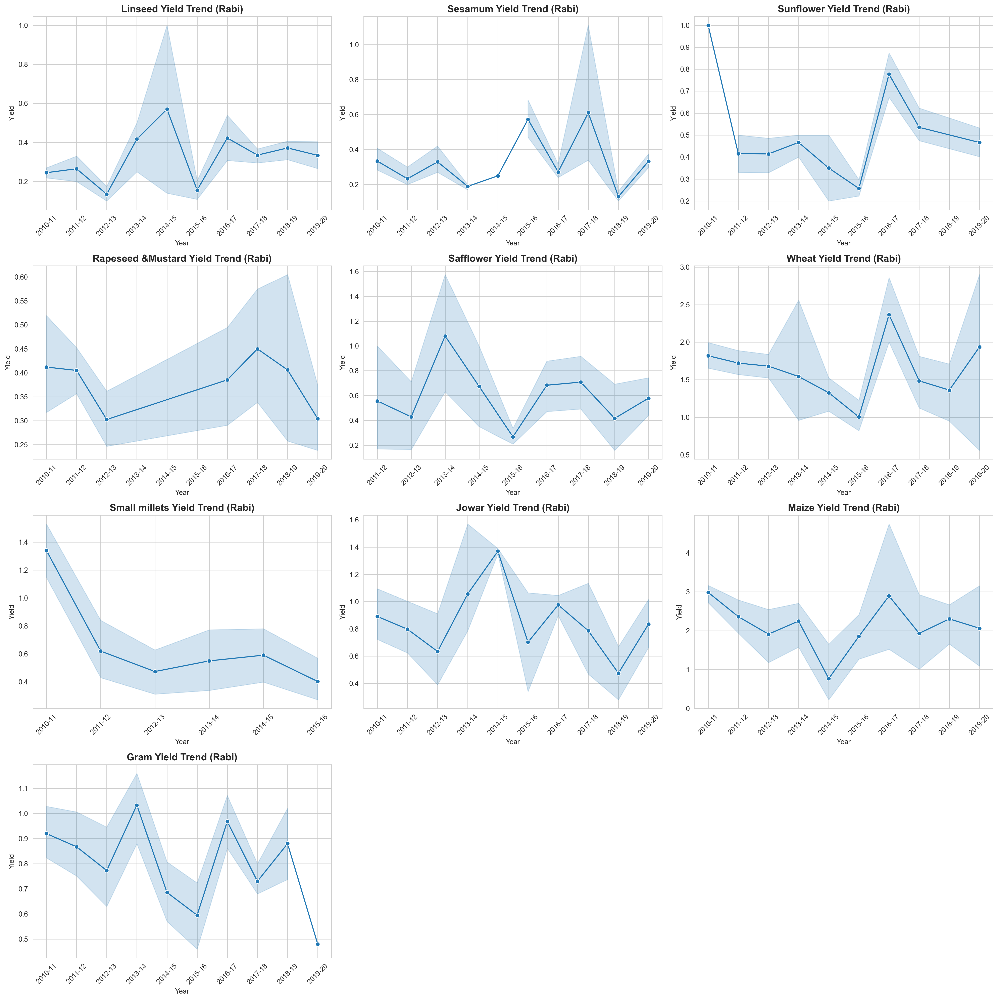

In [48]:
# --------------------------
# RABI SEASON VISUALIZATION
# --------------------------

# Filter only rabi season data
rabi_data = df[df['Season'] == 'Rabi'].copy()

# Get all unique crop names grown in rabi
unique_rabi_crops = rabi_data['Crop'].unique()

# Define the desired order of years
year_order = sorted(rabi_data['Year'].unique())

# Convert 'Year' to a categorical type with ordered categories
rabi_data['Year'] = pd.Categorical(rabi_data['Year'], categories=year_order, ordered=True)

# Count number of unique crops
num_crops = len(unique_rabi_crops)

# Define number of columns in subplot grid
num_cols = 3

# Calculate required number of rows to fit all crops
num_rows = (num_crops + num_cols - 1) // num_cols

# Create subplot grid (rows x cols) with large figure size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Flatten axes array to easily loop through
axes = axes.flatten()

# Loop through each crop and plot yield trends
for i, crop in enumerate(unique_rabi_crops):
    # Filter data for the specific crop
    crop_data = rabi_data[rabi_data['Crop'] == crop]

    # Plot line graph with markers (Year vs Yield)
    sns.lineplot(data=crop_data, x='Year', y='Yield', ax=axes[i], marker='o')

    # Set title for each subplot
    axes[i].set_title(f'{crop} Yield Trend (Rabi)', fontsize=14, fontweight='bold')

    # Label X and Y axes
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Yield')

    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=45)

# Remove extra unused subplots (if grid has more cells than crops)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout so titles/labels don’t overlap
plt.tight_layout()

# Display the figure
plt.show()

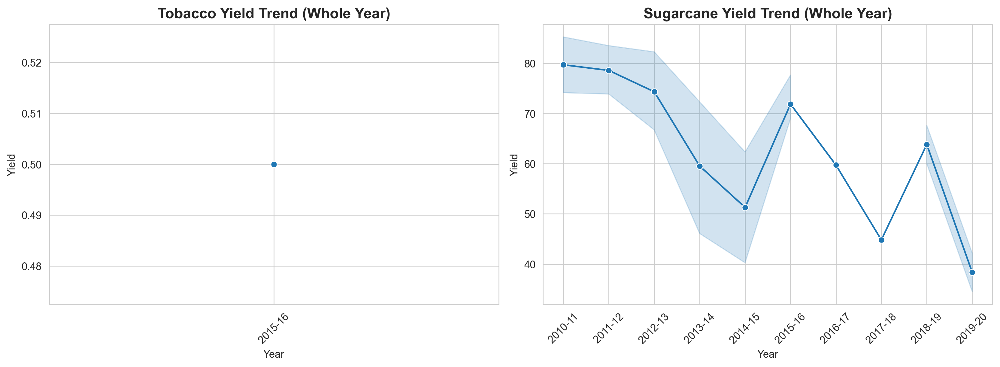

In [49]:
# --------------------------
# WHOLE YEAR SEASON VISUALIZATION
# --------------------------

# Filter only Whole Year season data
whole_data = df[df['Season'] == 'Whole Year'].copy()

# Get all unique crop names grown in Whole Year
unique_whole_crops = whole_data['Crop'].unique()

# Define the desired order of years
year_order = sorted(whole_data['Year'].unique())

# Convert 'Year' to a categorical type with ordered categories
whole_data['Year'] = pd.Categorical(whole_data['Year'], categories=year_order, ordered=True)

# Count number of unique crops
num_crops = len(unique_whole_crops)

# Define number of columns in subplot grid
num_cols = 3

# Calculate required number of rows to fit all crops
num_rows = (num_crops + num_cols - 1) // num_cols

# Create subplot grid (rows x cols) with large figure size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Flatten axes array to easily loop through
axes = axes.flatten()

# Loop through each crop and plot yield trends
for i, crop in enumerate(unique_whole_crops):
    # Filter data for the specific crop
    crop_data = whole_data[whole_data['Crop'] == crop]

    # Plot line graph with markers (Year vs Yield)
    sns.lineplot(data=crop_data, x='Year', y='Yield', ax=axes[i], marker='o')

    # Set title for each subplot
    axes[i].set_title(f'{crop} Yield Trend (Whole Year)', fontsize=14, fontweight='bold')

    # Label X and Y axes
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Yield')

    # Rotate x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=45)

# Remove extra unused subplots (if grid has more cells than crops)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout so titles/labels don’t overlap
plt.tight_layout()

# Display the figure
plt.show()

# Findings: Yield Trends for Kharif, Rabi and Whole Year Crops

## Kharif Season
- Many crops show **greater fluctuations in yield** compared to Rabi, since Kharif depends heavily on monsoon rains.  
- Some crops exhibit **sharp dips in specific years**, likely due to droughts or excessive rainfall.  
- A few crops show **steady improvement**, possibly due to better rainfall prediction and irrigation support.  
- Crops like rice (if present) typically dominate Kharif trends and may show stable or rising yields.

## Rabi Season
- Many crops exhibit a **steady increase in yield over years**, likely due to stable weather and irrigation support in Rabi.
- Some crops show **seasonal yield dips** at specific years, possibly reflecting drought or market shifts.
- A few crops have **volatile yield patterns**, which may require targeted research and crop management strategies.

## Summer Season
- Some crops show **consistent upward trends** in yield, indicating better adaptation or improved farming practices.
- A few crops have **fluctuating yields**, suggesting possible climate or soil-related sensitivity.
- Certain crops demonstrate **declining yields**, which may be due to reduced cultivation area, pest attacks, or lack of water availability.


## Key Insights

- **Kharif crops** are more climate-sensitive due to reliance on monsoon rainfall, showing high variability.  

- **Rabi crops** appear more stable in yield, likely because of better irrigation availability.  
- Identifying crops with **declining or volatile yields** can help policymakers and farmers focus on improving productivity through better seeds, fertilizers, or climate adaptation strategies.

- **Summer crops** generally show higher fluctuations due to dependence on rainfall.  

- **Whole year data** smooths out seasonal fluctuations, making it easier to see whether a crop’s long-term yield is increasing or decreasing.  
- Comparing all four visualizations (Summer, Rabi, Kharif, Yearly) allows researchers to pinpoint:  
  - Which crops are **season-dependent**.  
  - Which crops are **improving consistently** across all conditions.  
  - Which crops **need interventions** (e.g., better seeds, pest resistance, irrigation support).


In [64]:
# ==============================
# District-Wise Crop Production
# ==============================
# Unique districts
districts = df['District'].unique()
n_districts = len(districts)

import math
# Define subplot grid
cols = 3
rows = math.ceil(n_districts / cols)


fig, axes = plt.subplots(rows, cols, figsize=(18, rows * 5))
axes = axes.flatten()


# Loop through each district and plot crops vs production
for i, district in enumerate(districts):
  district_data = df[df['District'] == district]
  sns.barplot(x='Crop', y='Production', data=district_data,ci=None, ax=axes[i])
  axes[i].set_title(f"{district}", fontsize=14)
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
  axes[i].set_ylabel("Total Production")
  axes[i].set_xlabel("Crop")


# Hide any unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.savefig("District-Wise Crop Distribution.jpg")
plt.show()

In [51]:
# Feature selection and preprocessing
target = 'Yield'
features = df.drop(columns=[target])

In [52]:
# Separate categorical and numerical columns
categorical_columns = features.select_dtypes(include=['object']).columns
numerical_columns = features.select_dtypes(include=['int64', 'float64']).columns

In [53]:
# Encode categorical data
encoder = OneHotEncoder(handle_unknown='ignore')
categorical_encoded = encoder.fit_transform(features[categorical_columns]).toarray()
categorical_feature_names = encoder.get_feature_names_out(categorical_columns)

In [54]:
# Scale numerical data
scaler = StandardScaler()
numerical_scaled = scaler.fit_transform(features[numerical_columns])

In [55]:
# Combine processed features
X_processed = np.hstack((numerical_scaled, categorical_encoded))
feature_names = list(numerical_columns) + list(categorical_feature_names)

In [56]:
# Split the data into training and testing sets
X = X_processed
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [57]:
def evaluate_model(true, predicted):
    mae = mean_absolute_error(true, predicted)
    mse = mean_squared_error(true, predicted)
    rmse = np.sqrt(mean_squared_error(true, predicted))
    r2_square = r2_score(true, predicted)
    return mae, rmse, r2_square

In [58]:
models = {
    "Linear Regression": LinearRegression(),
    "K-Neighbors Regressor": KNeighborsRegressor(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest Regressor": RandomForestRegressor(random_state=42),
    "XGBRegressor": XGBRegressor(random_state=42),
    "AdaBoost Regressor": AdaBoostRegressor(random_state=42)
}
model_list = []
r2_list =[]

In [59]:
for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Evaluate Train and Test dataset
    model_train_mae , model_train_rmse, model_train_r2 = evaluate_model(y_train, y_train_pred)

    model_test_mae , model_test_rmse, model_test_r2 = evaluate_model(y_test, y_test_pred)


    print(list(models.keys())[i])
    model_list.append(list(models.keys())[i])

    print('Model performance for Training set')
    print("- Root Mean Squared Error: {:.4f}".format(model_train_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_train_mae))
    print("- R2 Score: {:.4f}".format(model_train_r2))

    print('----------------------------------')

    print('Model performance for Test set')
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae))
    print("- R2 Score: {:.4f}".format(model_test_r2))
    r2_list.append(model_test_r2)

    print('='*35)
    print('\n')

Linear Regression
Model performance for Training set
- Root Mean Squared Error: 2.4277
- Mean Absolute Error: 0.8149
- R2 Score: 0.9726
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 2.5577
- Mean Absolute Error: 0.8156
- R2 Score: 0.9541


K-Neighbors Regressor
Model performance for Training set
- Root Mean Squared Error: 1.7368
- Mean Absolute Error: 0.4612
- R2 Score: 0.9860
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 1.8069
- Mean Absolute Error: 0.5317
- R2 Score: 0.9771


Decision Tree
Model performance for Training set
- Root Mean Squared Error: 0.0000
- Mean Absolute Error: 0.0000
- R2 Score: 1.0000
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 1.7553
- Mean Absolute Error: 0.3878
- R2 Score: 0.9784


Random Forest Regressor
Model performance for Training set
- Root Mean Squared Error: 1.0172
- Mean Absolute Error: 0.1855
- R2 Score: 0.99

In [60]:
# Find the best model based on R2 score
best_model_index = r2_list.index(max(r2_list))
best_model_name = model_list[best_model_index]
best_model = list(models.values())[best_model_index]

print(f"Best Model: {best_model_name}")

# Use the best model to make predictions on the test set
y_pred_best_model = best_model.predict(X_test)

# Evaluate the best model
mae_best, rmse_best, r2_best = evaluate_model(y_test, y_pred_best_model)

print('\nModel performance for Test set (Best Model)')
print("- Root Mean Squared Error: {:.4f}".format(rmse_best))
print("- Mean Absolute Error: {:.4f}".format(mae_best))
print("- R2 Score: {:.4f}".format(r2_best))

Best Model: Decision Tree

Model performance for Test set (Best Model)
- Root Mean Squared Error: 1.7553
- Mean Absolute Error: 0.3878
- R2 Score: 0.9784


In [61]:
score = r2_best*100
print(" Accuracy of the model is %.2f" %score)

 Accuracy of the model is 97.84


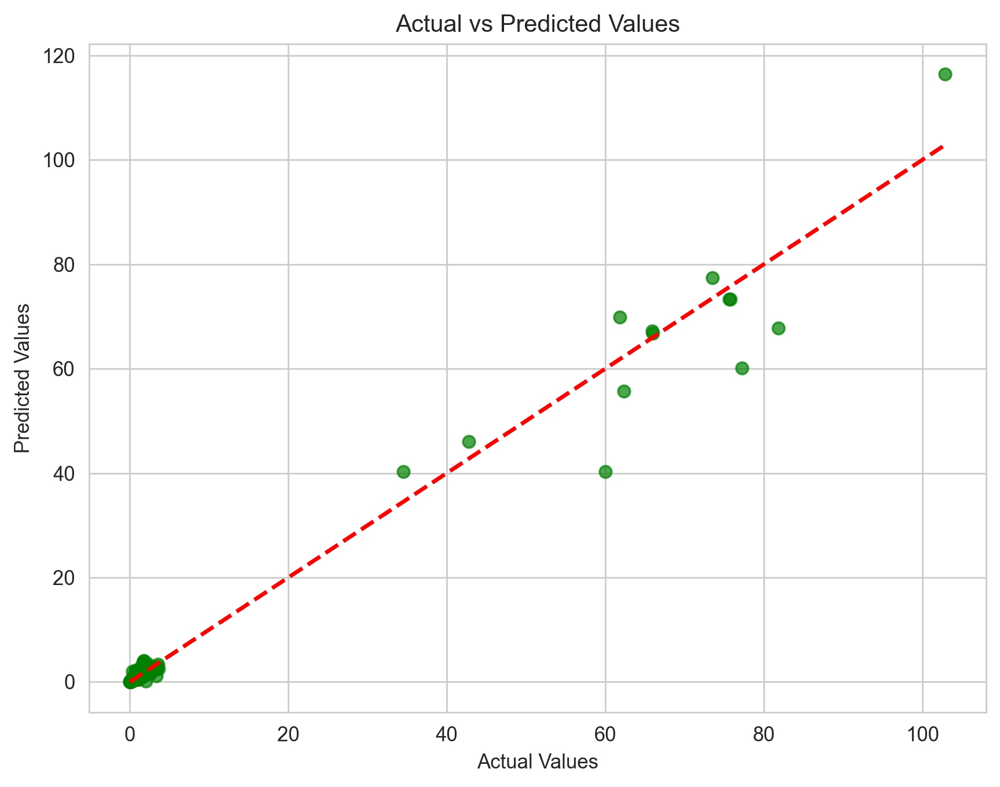

In [62]:
# Visualization of predictions vs actual values for the last model
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_best_model, alpha=0.7, color='g')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Values')
plt.show()

In [63]:
pred_values=pd.DataFrame({'Actual Value':y_test,'Predicted Value':y_pred_best_model})
pred_values

,Actual Value,Predicted Value
544,1.22,1.14
1986,3.48,2.91
420,0.20,0.20
527,1.73,1.62
196,0.26,0.23
...,...,...
1468,1.00,1.00
447,1.62,3.50
1995,0.47,0.37
73,2.00,2.86
